<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/synthetic_data_generation_0206.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random

In [3]:
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

## concept drift의 case #1

Concept(Rule)의 변화 : O<br>
Importance의 변화 : X<br>
Drift의 변화 : X<br>

In [4]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,2,2,3,3,4,4,5,5]
# 난수의 표준편차
stds =  [0.5,0.5,0.4,0.4,0.3,0.3,0.2,0.2,0.1,0.1]
# feature의 가중치
wss =   [0.5,0.4,0.3,0.2,0.1,0.1,0.1,0.3,0.1,0.1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    '''
    d1 = random.uniform(0.5, 10.0)
    d2 = random.uniform(0.0, 0.001)
    d3 = random.uniform(0.0, 0.003)
    w = random.uniform(0, 5)
    w_delta = random.uniform(-0.003, 0.001)
    '''
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds[f],10))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.3,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

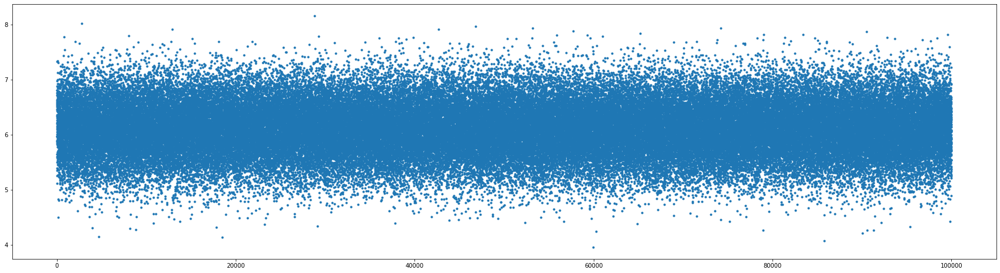

In [5]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [15]:
mn = np.mean(y)
print('Y mean:',mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
# 여기서 rule을 중간에 바꾸어서 concept drift 유도한다.
dataset[50000:]['y'] = [1 if i > mn*1.2 else 0 for i in y[50000:]]
dataset

Y mean: 6.09906936155633


<ipython-input-15-9dd724bb50d2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[50000:]['y'] = [1 if i > mn*1.2 else 0 for i in y[50000:]]


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.478420,2.039846,1.760227,2.748881,3.122279,3.759205,3.898760,4.043421,4.972478,5.070283,1
1,0.589572,0.292034,2.015673,2.190813,2.823849,3.164680,4.156987,4.333016,5.024415,4.956110,0
2,1.332573,1.007856,2.118904,2.165509,3.262793,2.745448,3.789326,3.965454,5.040896,5.171349,1
3,1.911313,1.576599,2.197231,1.575576,3.025821,3.295024,4.221939,4.004038,5.139957,4.975888,1
4,0.279208,1.943845,1.978129,1.520172,2.883163,2.603396,3.583924,4.113184,5.056238,4.905676,1
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.155391,0.576841,2.584819,2.057969,3.159650,2.900298,4.278165,4.160143,5.167797,4.958331,0
99996,0.077847,1.289831,1.894075,1.622249,3.395714,2.312654,4.148810,3.834544,5.106822,5.061221,0
99997,1.606911,1.448872,2.083521,2.782361,2.647352,3.477104,4.162590,4.233203,5.219531,5.174337,0
99998,0.440485,1.248778,2.227308,1.799038,2.947333,2.768859,4.053802,3.961194,5.016789,4.970961,0


In [ ]:
dataset.to_csv('/content/drive/MyDrive/laos/synthetic_dataset_2_0115.csv')

In [16]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_fscore_support

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.8108108108108109, 0.7109004739336493, 0.7575757575757576, None)

In [17]:

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]   
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)
    
    #if ks_stat == minS:
    #    ks_stat = -ks_stat
    
    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

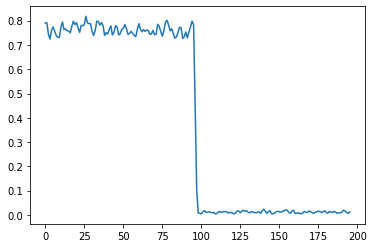

In [18]:
import math

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot()

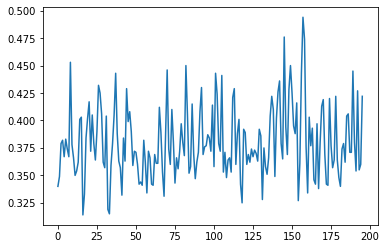

In [19]:
result_df['drift'].plot()

In [20]:

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

  feature  importance
0      x0    0.079362
1      x1    0.067436
2      x2    0.018844
3      x8    0.017797
4      x6    0.016094
5      x3    0.006814
6      x9    0.003615
7      x4    0.000000
8      x5    0.000000
9      x7    0.000000


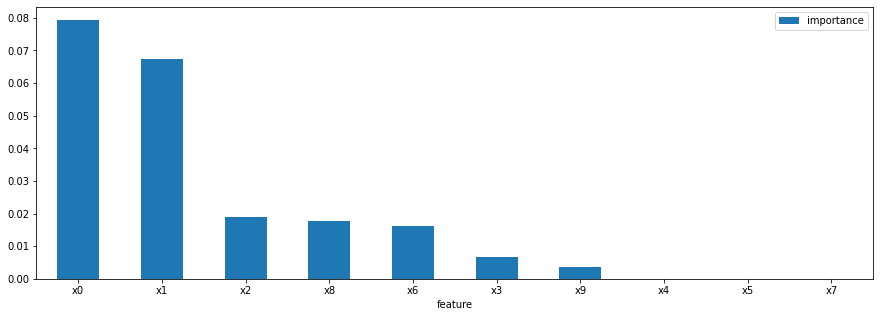

In [21]:
COLUMNS = ['x0','x1','x2','x3','x4','x5','x6','x7','x8','x9']
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))

imp_df3 = pd.DataFrame({'feature':mi_scores.keys()[:10],'importance':mi_scores.values[:10]})
print(imp_df3)
imp_df3.plot.bar(x='feature',rot=0,figsize=(15,5))

In [24]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)    
    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


196/196 f1:0.0125

[]

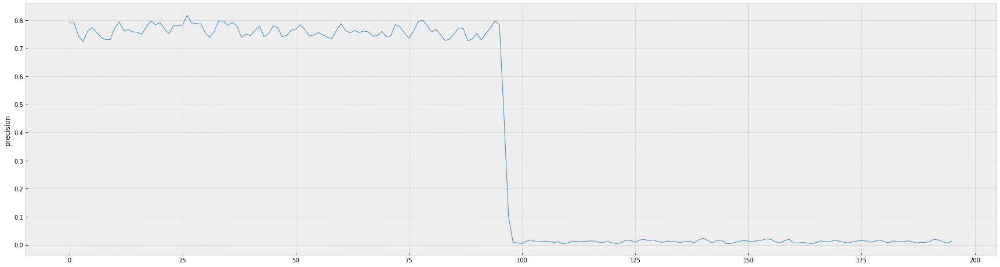

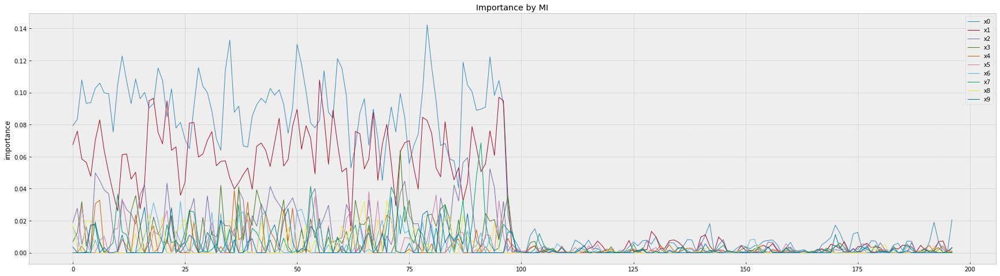

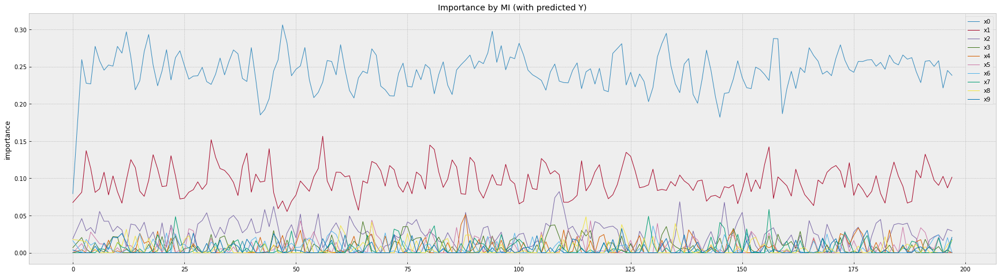

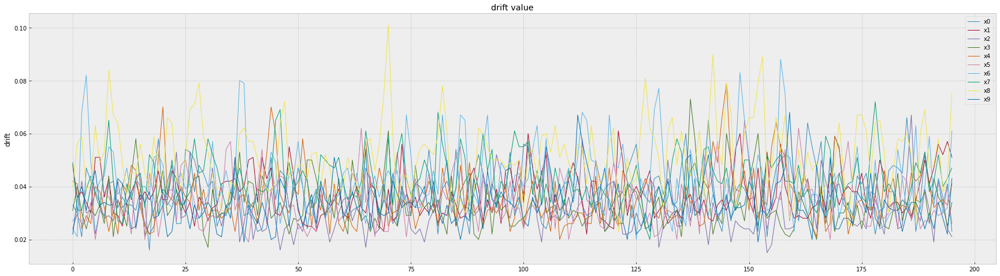

In [25]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

rule을 바꾼 concept drift는 PMI에서 변화를 감지 할 수 없다... 당연한거 아님!!!

## concept drift의 case #2

Concept(Rule)의 변화 : X<br>
Importance의 변화 : O<br>
Drift의 변화 : X<br>

In [28]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,2,2,3,3,4,4,5,5]
# 난수의 표준편차
stds =  [0.5,0.5,0.4,0.4,0.3,0.3,0.2,0.2,0.1,0.1]
# feature의 가중치
wss1 =   [0.1,0.1,0.1,0.1,0.4,0.5,0.3,0.1,0.1,0.1]
wss2 =   [0.1,0.5,0.1,0.1,0.1,0.2,0.1,0.1,0.1,0.4]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    '''
    d1 = random.uniform(0.5, 10.0)
    d2 = random.uniform(0.0, 0.001)
    d3 = random.uniform(0.0, 0.003)
    w = random.uniform(0, 5)
    w_delta = random.uniform(-0.003, 0.001)
    '''
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds[f],10))
            #weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            if i > 500:
                weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))
            else:
                weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.3,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

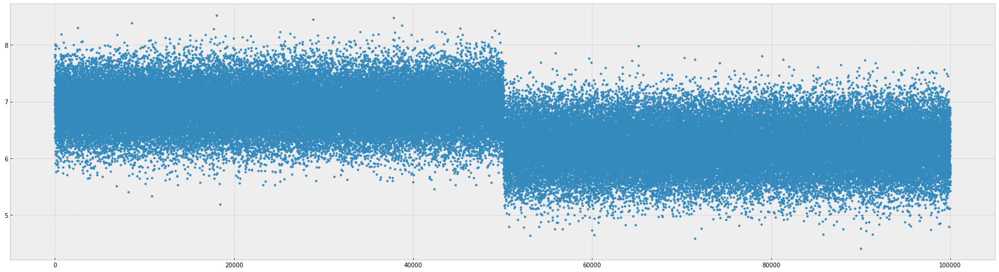

In [29]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [30]:
mn = np.mean(y[0:1000])
print("Y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

Y mean: 6.8977442646784075


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.478420,2.039846,1.760227,2.748881,3.122279,3.759205,3.898760,4.043421,4.972478,5.070283,1
1,0.589572,0.292034,2.015673,2.190813,2.823849,3.164680,4.156987,4.333016,5.024415,4.956110,1
2,1.332573,1.007856,2.118904,2.165509,3.262793,2.745448,3.789326,3.965454,5.040896,5.171349,1
3,1.911313,1.576599,2.197231,1.575576,3.025821,3.295024,4.221939,4.004038,5.139957,4.975888,1
4,0.279208,1.943845,1.978129,1.520172,2.883163,2.603396,3.583924,4.113184,5.056238,4.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.155391,0.576841,2.584819,2.057969,3.159650,2.900298,4.278165,4.160143,5.167797,4.958331,0
99996,0.077847,1.289831,1.894075,1.622249,3.395714,2.312654,4.148810,3.834544,5.106822,5.061221,0
99997,1.606911,1.448872,2.083521,2.782361,2.647352,3.477104,4.162590,4.233203,5.219531,5.174337,0
99998,0.440485,1.248778,2.227308,1.799038,2.947333,2.768859,4.053802,3.961194,5.016789,4.970961,0


In [31]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values
base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')
base_score

(0.6857142857142857, 0.6857142857142857, 0.6857142857142857, None)

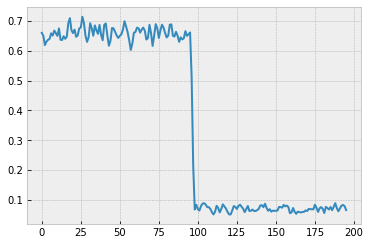

In [33]:
import math

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot()

In [34]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)    
            
    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


196/196 f1:0.0654

[]

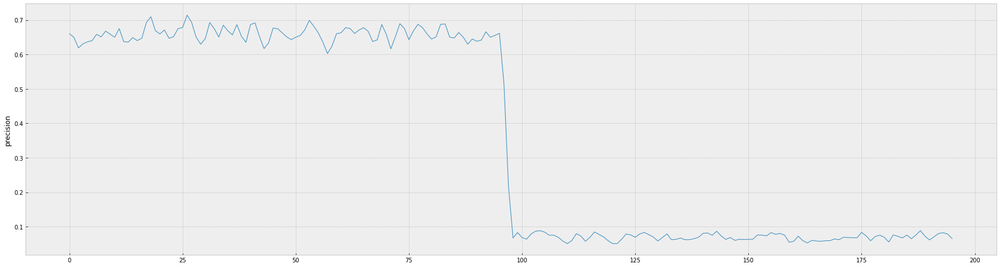

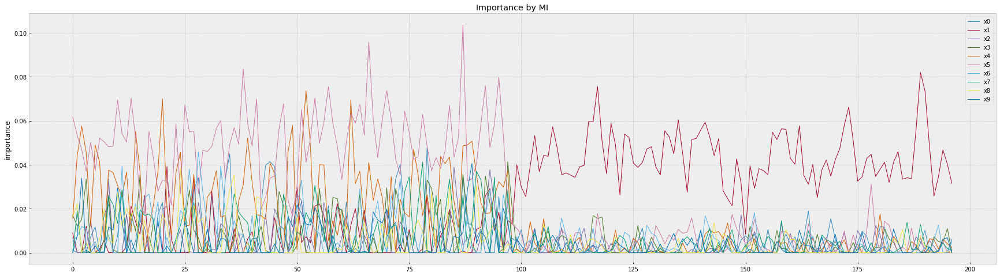

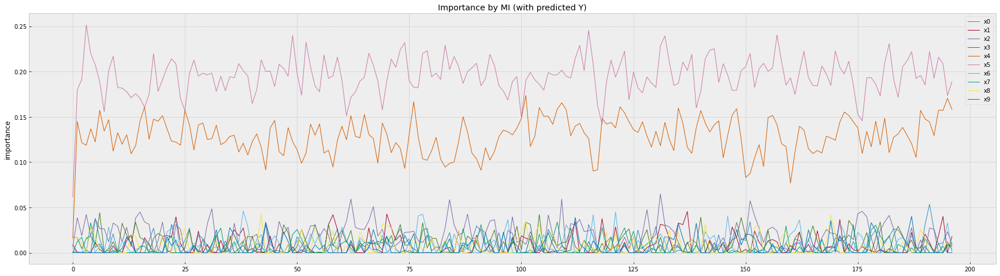

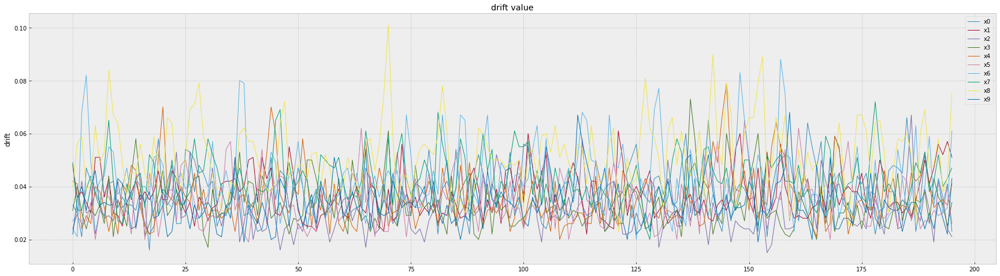

In [35]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

importance가 변하는 concept drift는 PMI에서 변화를 감지 할 수 없다... 당연한거 아님!!!

## concept drift의 case #3

Concept(Rule)의 변화 : X<br>
Importance의 변화 : X<br>
Drift의 변화 : X<br>

In [36]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds1[f]*0.1,10))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.05,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

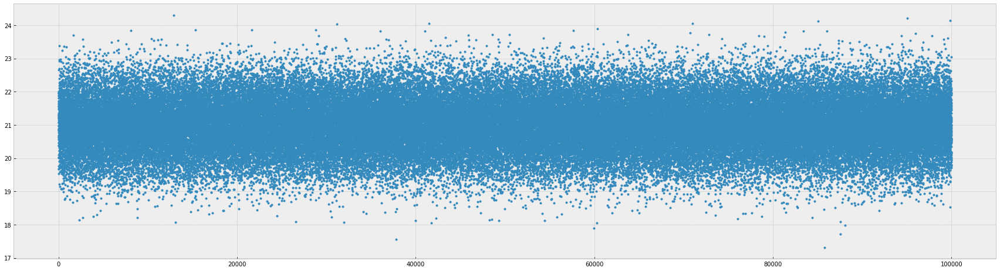

In [37]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [38]:
mn = np.mean(y[0:1000])
print("Y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

Y mean: 21.007586519283517


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,1.207969,0.940057,1.187220,1.040760,1.253068,0.949380,1.021710,0.972478,1.070283,1
1,0.917914,0.858407,1.003918,1.047703,0.941283,1.054893,1.078493,1.166508,1.024415,0.956110,0
2,1.066515,1.001571,1.029726,1.041377,1.087598,0.915149,0.894663,0.982727,1.040896,1.171349,1
3,1.182263,1.115320,1.049308,0.893894,1.008607,1.098341,1.110970,1.002019,1.139957,0.975888,1
4,0.855842,1.188769,0.994532,0.880043,0.961054,0.867799,0.791962,1.056592,1.056238,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.831078,0.915368,1.146205,1.014492,1.053217,0.966766,1.139083,1.080071,1.167797,0.958331,0
99996,0.815569,1.057966,0.973519,0.905562,1.131905,0.770885,1.074405,0.917272,1.106822,1.061221,0
99997,1.121382,1.089774,1.020880,1.195590,0.882451,1.159035,1.081295,1.116602,1.219531,1.174337,1
99998,0.888097,1.049756,1.056827,0.949760,0.982444,0.922953,1.026901,0.980597,1.016789,0.970961,0


In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_fscore_support

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.9333333333333333, 0.8921568627450981, 0.9122807017543859, None)

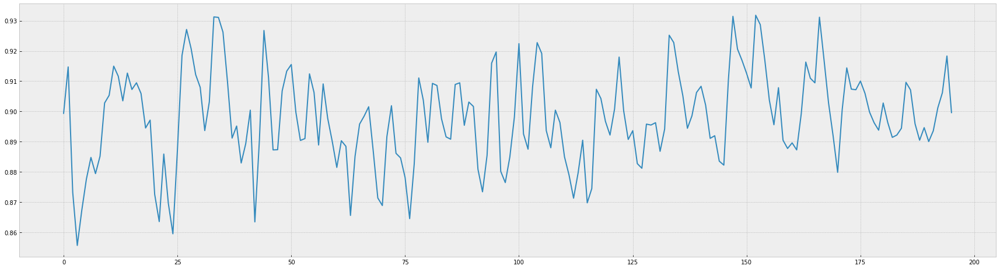

In [40]:
import math

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

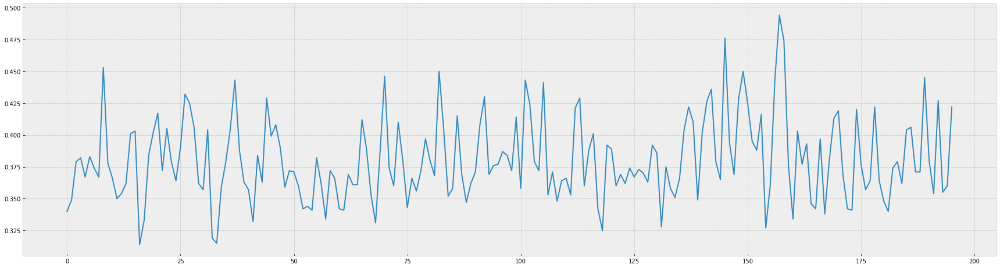

In [41]:
result_df['drift'].plot(figsize=(30,8))

In [42]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)  

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


         x0        x1        x2        x3       x4   x5        x6   x7  \
0  0.135112  0.107205  0.034631  0.023061  0.00838  0.0  0.016655  0.0   

         x8        x9  
0  0.031466  0.011645  
196/196 f1:0.8996

[]

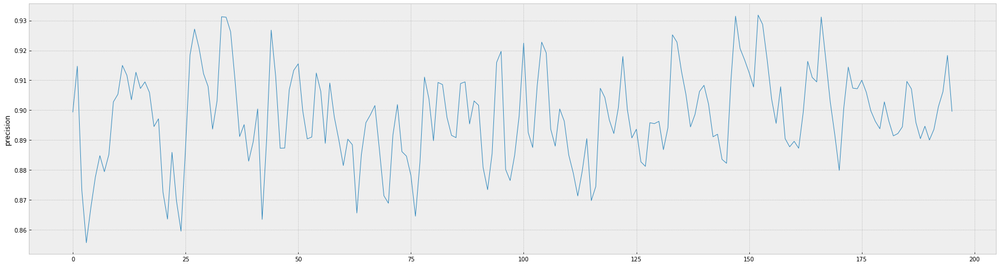

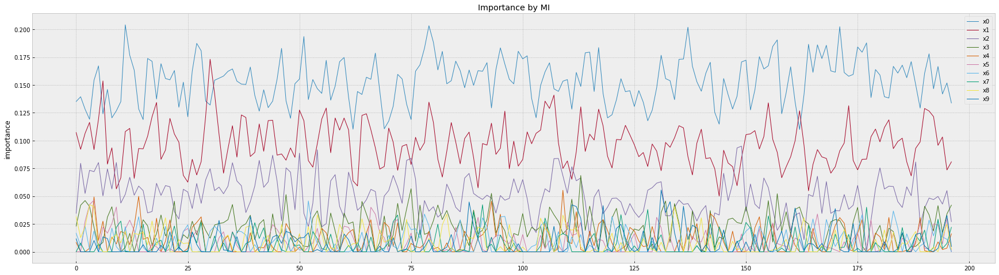

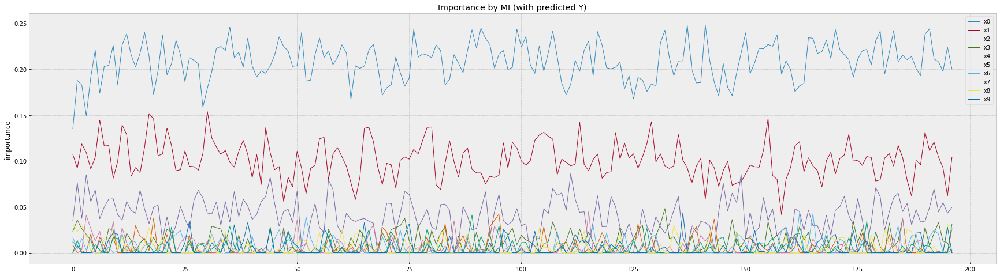

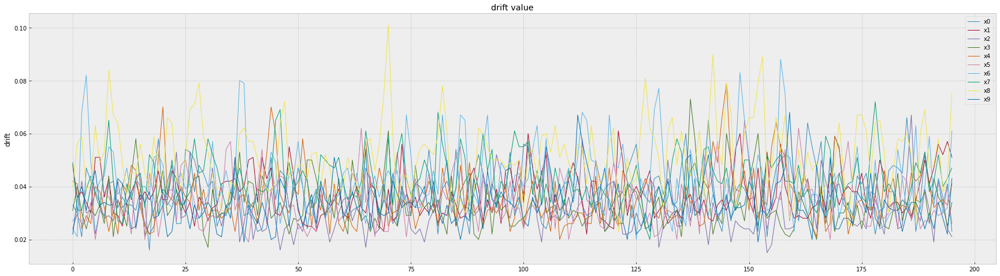

In [43]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

rule, importance, drift 변화가 없는 ... 아무것도 감지 않됨.


## concept drift의 case #4

Concept(Rule)의 변화 : X<br>
Importance의 변화 : X<br>
Drift의 변화 : O<br>
성능 변화 : X <br>


In [44]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds1[f]*0.1 + (i*0.0001),10))
            #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

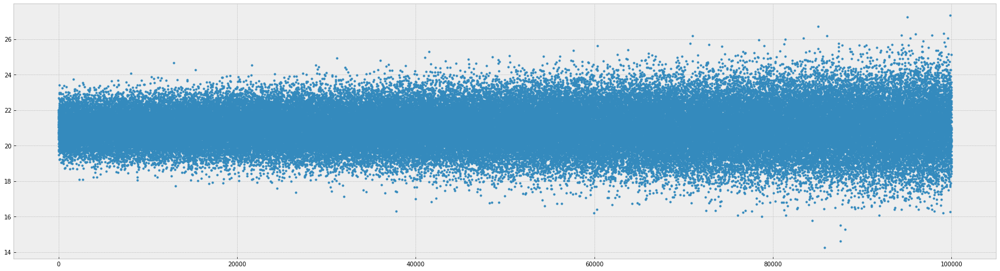

In [45]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [46]:
mn = np.mean(y[0:1000])
print("Y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

Y mean: 21.00842317843594


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,1.207969,0.940057,1.187220,1.040760,1.253068,0.949380,1.021710,0.972478,1.070283,1
1,0.917914,0.858407,1.003918,1.047703,0.941283,1.054893,1.078493,1.166508,1.024415,0.956110,0
2,1.066515,1.001571,1.029726,1.041377,1.087598,0.915149,0.894663,0.982727,1.040896,1.171349,1
3,1.182263,1.115320,1.049308,0.893894,1.008607,1.098341,1.110970,1.002019,1.139957,0.975888,1
4,0.855842,1.188769,0.994532,0.880043,0.961054,0.867799,0.791962,1.056592,1.056238,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.662325,0.830821,1.292263,1.028970,1.106380,0.933565,1.278026,1.160063,1.335427,0.916703,0
99996,0.631323,1.115875,0.947064,0.811219,1.263677,0.541999,1.148736,0.834627,1.213538,1.122382,0
99997,1.242643,1.179459,1.041740,1.390985,0.765019,1.317910,1.162508,1.233087,1.438843,1.348499,1
99998,0.776306,1.099462,1.113597,0.899569,0.964906,0.845983,1.053776,0.961213,1.033561,0.941952,0


In [47]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.9154228855721394, 0.9019607843137255, 0.9086419753086419, None)

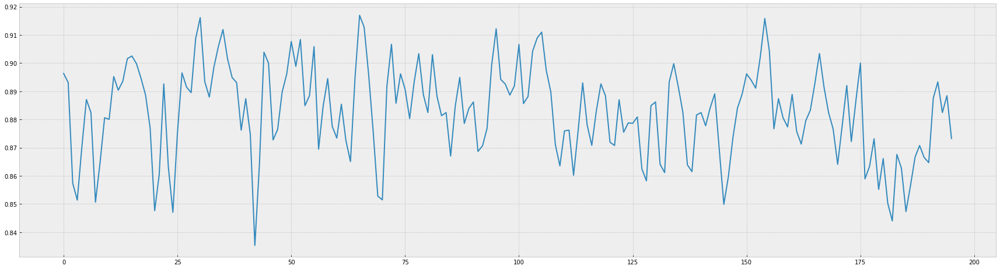

In [48]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

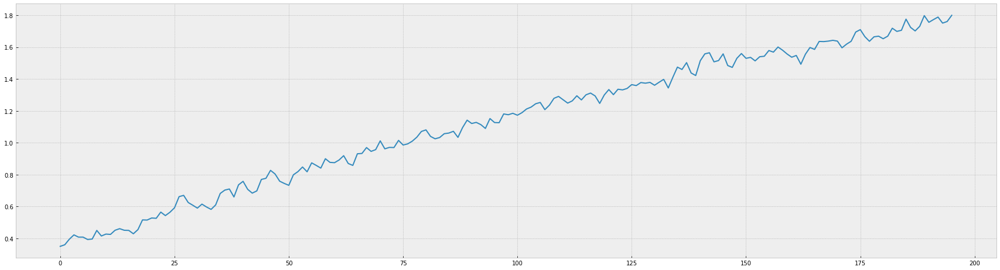

In [49]:
result_df['drift'].plot(figsize=(30,8))

In [50]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2       x3        x4   x5        x6   x7  \
0  0.140526  0.106718  0.040935  0.00785  0.015088  0.0  0.013804  0.0   

         x8        x9  
0  0.013673  0.015121  
196/196 f1:0.8733

[]

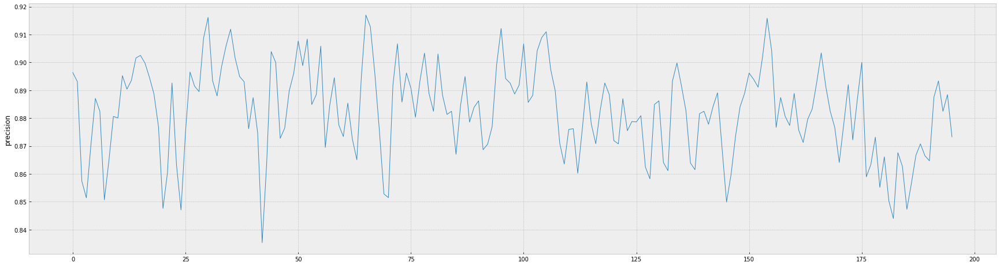

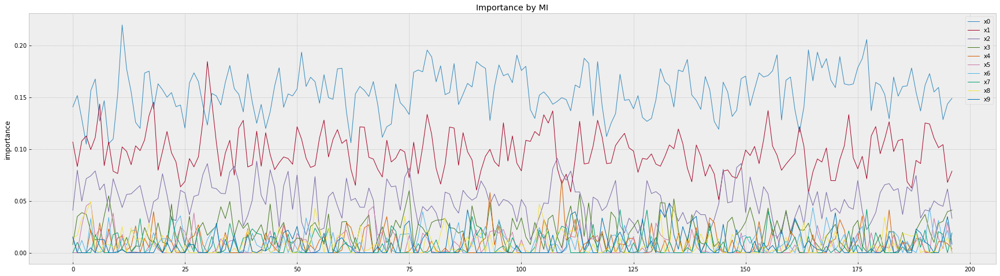

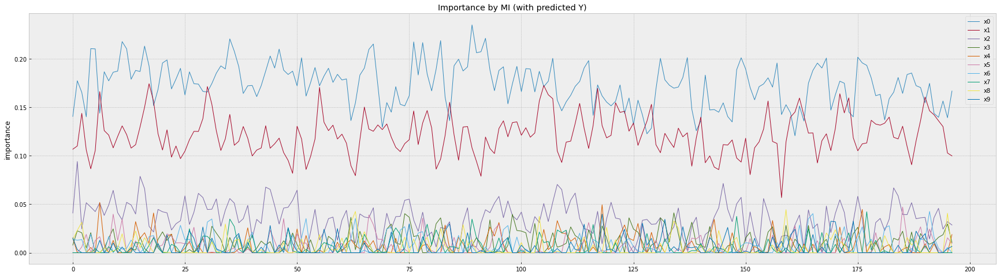

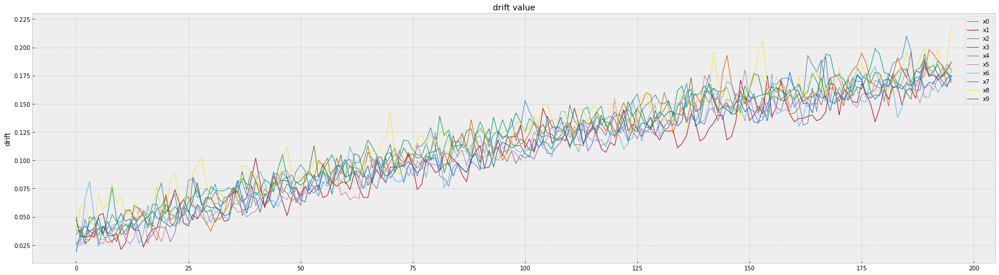

In [51]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

PMI 변화 없으며, drift는 증가 한다.

## concept drift의 case #5

Concept(Rule)의 변화 : X<br>
Importance의 변화 : X<br>
Drift의 변화 : O<br>
성능 변화 : O <br>

In [52]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

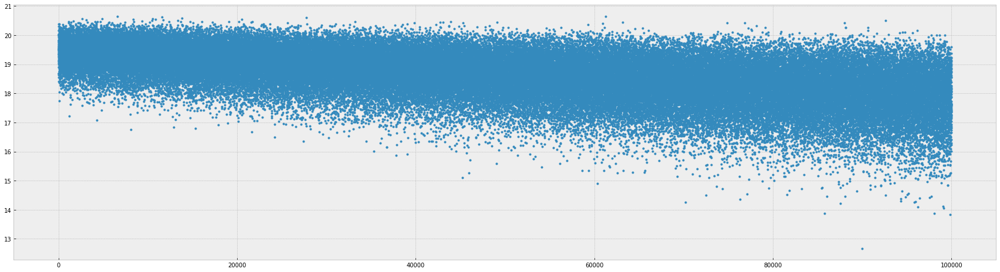

In [53]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [54]:
mn = np.mean(y[0:1000])
print("Y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

Y mean: 19.406379713350987


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.662325,0.830821,0.707737,0.971030,0.893620,0.933565,0.721974,0.839937,0.664573,0.916703,0
99996,0.631323,0.884125,0.947064,0.811219,0.736323,0.541999,0.851264,0.834627,0.786462,0.877618,0
99997,0.757357,0.820541,0.958260,0.609015,0.765019,0.682090,0.837492,0.766913,0.561157,0.651501,0
99998,0.776306,0.900538,0.886403,0.899569,0.964906,0.845983,0.946224,0.961213,0.966439,0.941952,0


In [55]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score


(0.8803827751196173, 0.9387755102040817, 0.908641975308642, None)

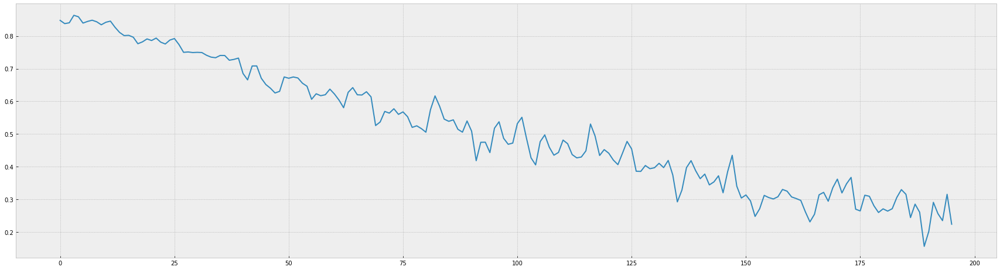

In [56]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

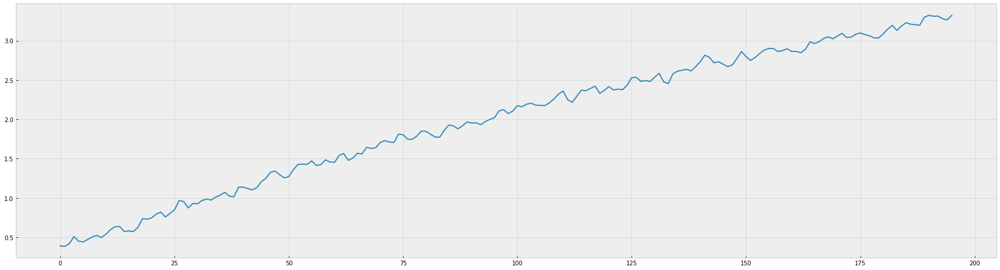

In [57]:
result_df['drift'].plot(figsize=(30,8))

In [58]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
196/196 f1:0.2243

[]

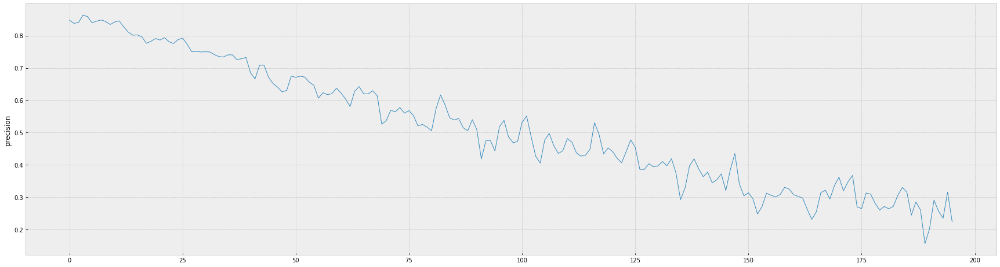

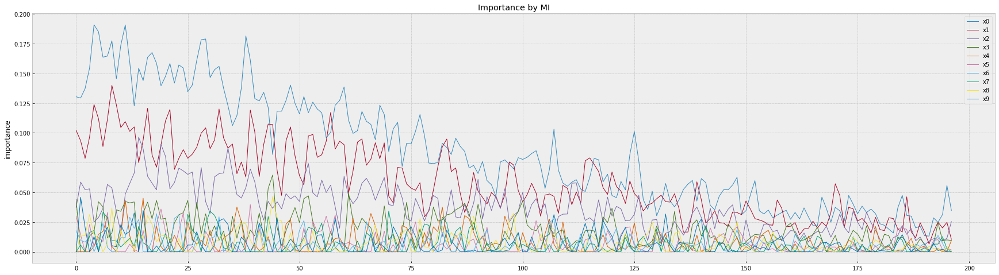

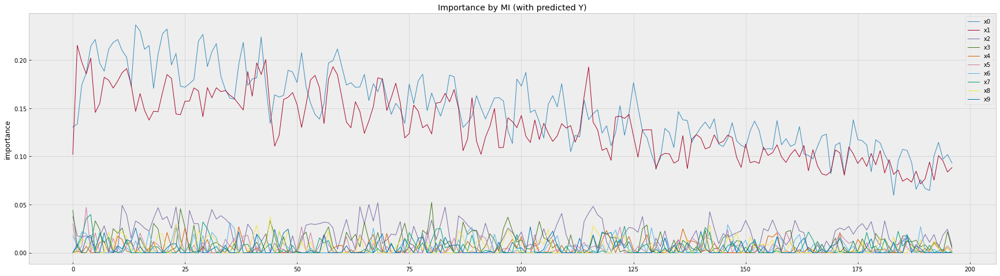

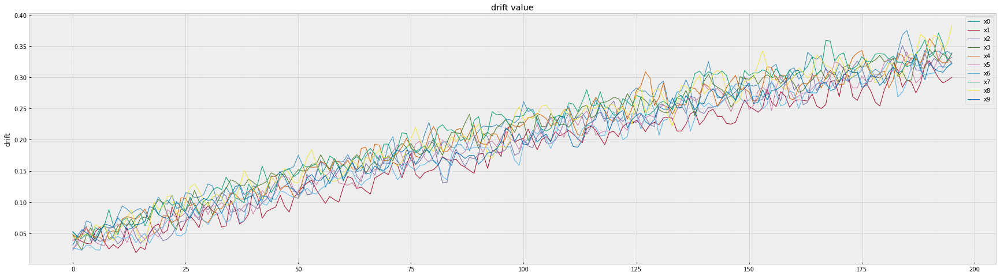

In [59]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

Drift에 의해 성능이 낮아지는 경우, 
PMI에 반영되어 낮아진다.<br>
항상 낮아지는 것은 아닐 듯... 어쨋든 PMI의 변화가 감지 된다.

## concept drift의 case #6

Concept(Rule)의 변화 : X<br>
Importance의 변화 : X<br>
Drift의 변화 + 급격: O<br>
성능 변화 : O <br>

In [60]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [2,4,3,2,1,3,1,2,4,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))         
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0002),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

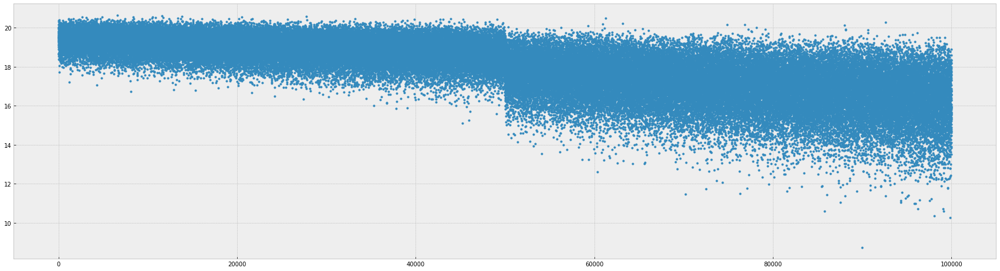

In [61]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [62]:
mn = np.mean(y[0:1000])
print("Y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

Y mean: 19.406379713350987


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.493572,0.746274,0.561678,0.956552,0.840457,0.900365,0.583030,0.759946,0.496944,0.875076,0
99996,0.447077,0.826217,0.920609,0.716876,0.604550,0.313113,0.776934,0.751982,0.679747,0.816458,0
99997,0.636096,0.730857,0.937401,0.413621,0.647588,0.523214,0.756278,0.650428,0.341845,0.477339,0
99998,0.664515,0.850833,0.829633,0.849379,0.947368,0.769014,0.919350,0.941829,0.949667,0.912942,0


In [63]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.8803827751196173, 0.9387755102040817, 0.908641975308642, None)

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


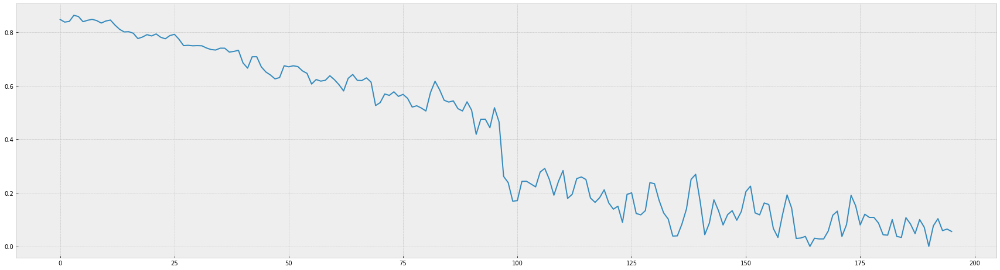

In [64]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

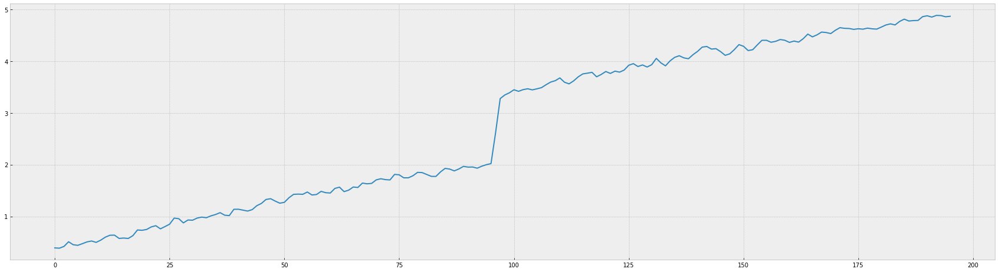

In [65]:
result_df['drift'].plot(figsize=(30,8))

In [66]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
165/196 f1:0.0000

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


191/196 f1:0.0000

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


196/196 f1:0.0556

[]

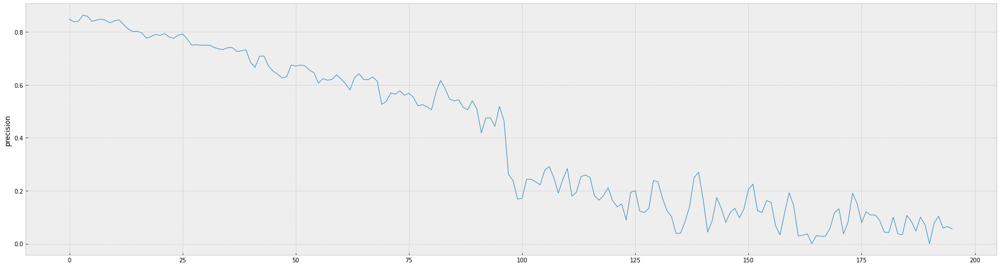

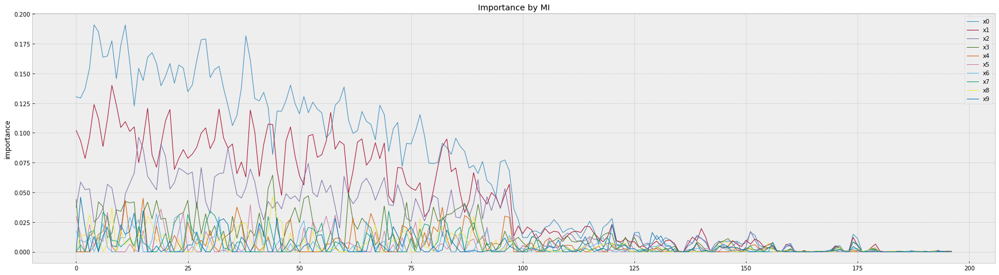

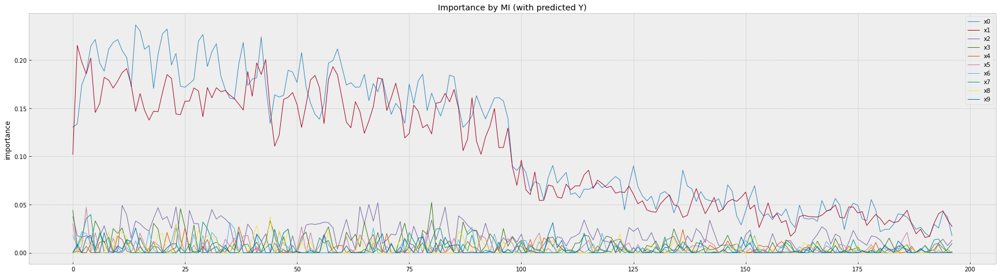

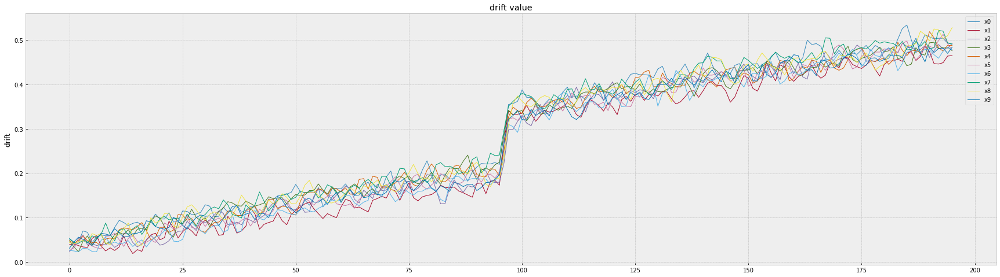

In [67]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


### 결론

급격한 Drift에 의해 성능이 급격히 낮아지는 경우, 
PMI도 급격히 낮아지며 반영된다.<br>
항상 낮아지는 것은 아닐 듯... 어쨋든 PMI의 변화가 감지 된다.

## concept drift의 case #7

Concept(Rule)의 변화 : X<br>
Importance의 변화  + 급격 : O<br>
Drift의 변화 + 급격: O<br>
성능 변화 : O <br>

In [172]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,0,0,0]
wss2 =   [0,0,0,1,1,1,2,3,4,5]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))

            if i < 300:
                #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))                
            #weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

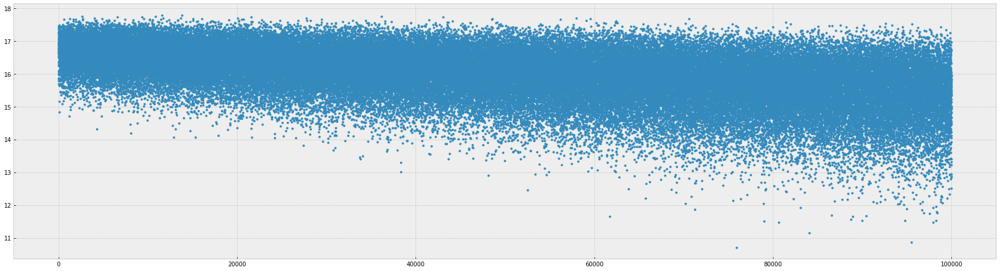

In [173]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [174]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

y mean: 16.6413393422204


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.493403,0.492294,0.415327,0.985522,0.893620,0.867098,0.721974,0.759866,0.832371,0.916703,0
99996,0.446892,0.652260,0.894101,0.905657,0.736323,0.083768,0.851264,0.751899,0.893285,0.877618,0
99997,0.635975,0.461444,0.916500,0.804605,0.765019,0.364020,0.837492,0.650312,0.780688,0.651501,0
99998,0.664403,0.701516,0.772749,0.949810,0.964906,0.691890,0.946224,0.941810,0.983228,0.941952,1


default performance: (0.8867924528301887, 0.9215686274509803, 0.9038461538461539, None)


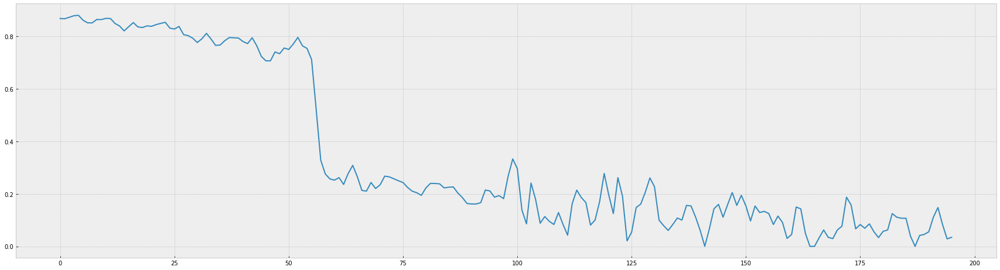

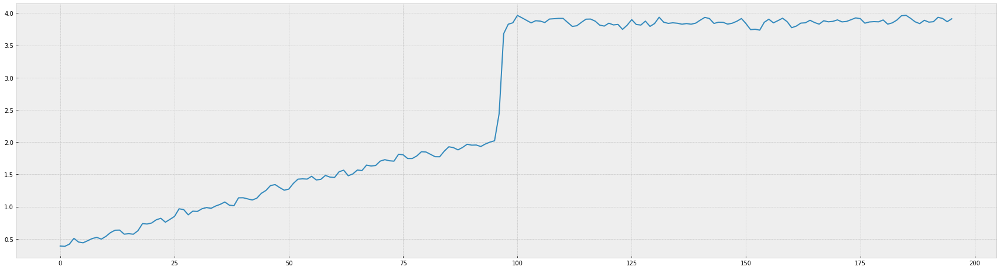

In [175]:

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [176]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3        x4      x5   x6        x7  \
0  0.140858  0.126233  0.031251  0.044341  0.001951  0.0106  0.0  0.010244   

    x8   x9  
0  0.0  0.0  
196/196 f1:0.0345

[]

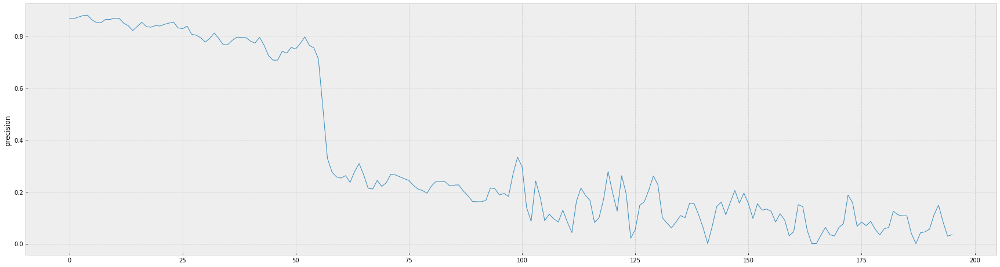

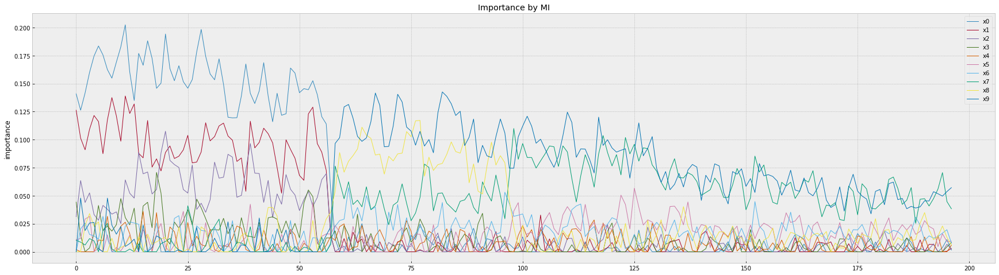

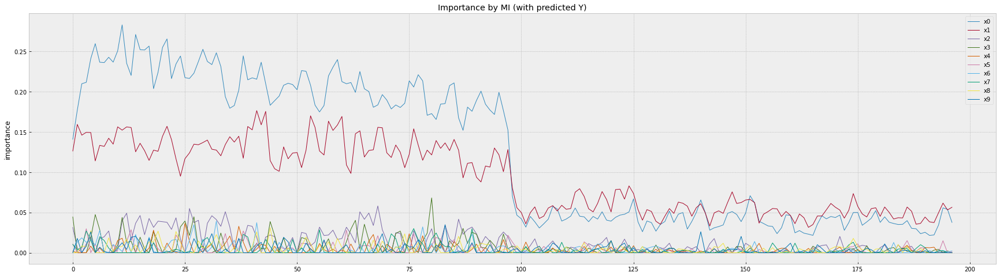

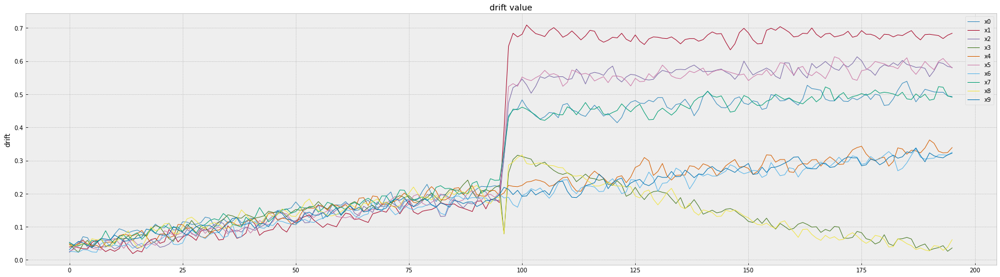

In [177]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


### 결론

급격한 importance & Drift에 의해 성능이 급격히 낮아지는 경우, <br>
PMI에는 Drift의 변화만 반영되고, importance의 변화 시점은 전혀 감지 되지 않는다.

## concept drift의 case #8

Concept(Rule)의 변화 : X<br>
Importance의 변화  + 점진 : O<br>
Drift의 변화 + 급격: O<br>
성능 변화 : O <br>


In [145]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,1,1,1]
wss2 =   [1,1,1,1,1,1,2,3,4,5]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 ,10))
            
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))
            
            ww = i/1000
            weight[f'w{f}'].extend((wss1[f]*(1-ww) + wss2[f]*ww) + np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

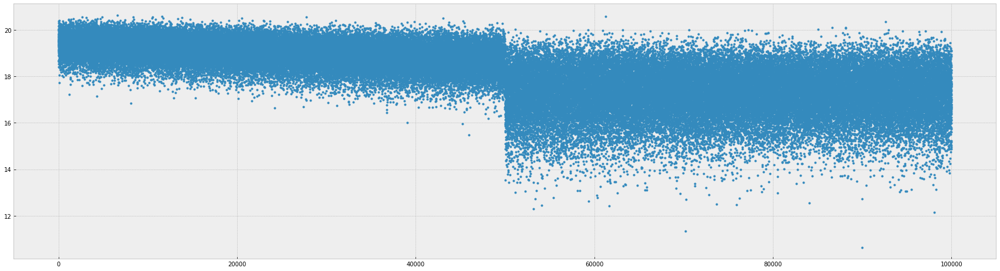

In [146]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [147]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

y mean: 19.406421012065977


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.493403,0.492294,0.415327,0.985522,0.893620,0.867098,0.721974,0.759866,0.832371,0.916703,0
99996,0.446892,0.652260,0.894101,0.905657,0.736323,0.083768,0.851264,0.751899,0.893285,0.877618,0
99997,0.635975,0.461444,0.916500,0.804605,0.765019,0.364020,0.837492,0.650312,0.780688,0.651501,0
99998,0.664403,0.701516,0.772749,0.949810,0.964906,0.691890,0.946224,0.941810,0.983228,0.941952,0


default performance: (0.8829268292682927, 0.9282051282051282, 0.905, None)


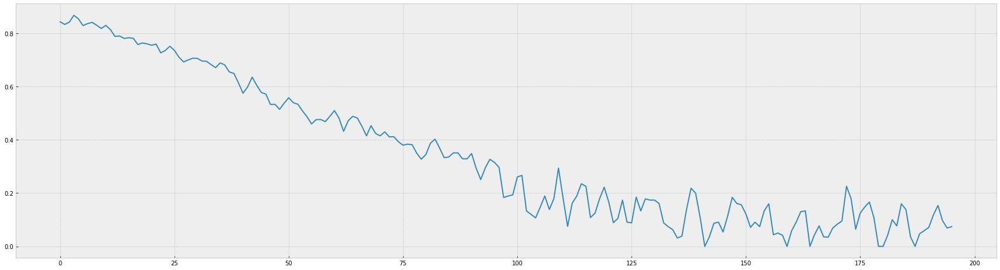

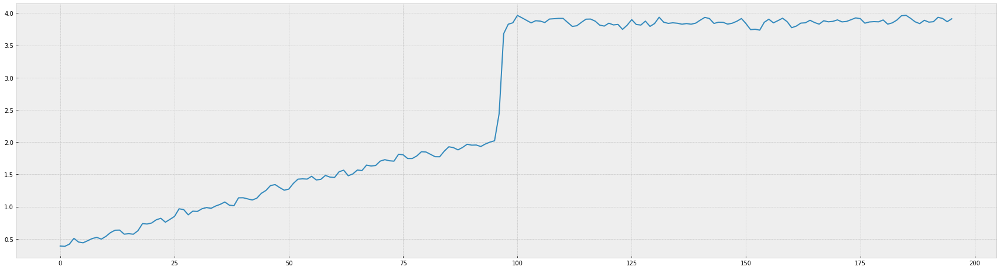

In [148]:


trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [149]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.132894  0.098522  0.037494  0.047287  0.0  0.029127  0.018814  0.0  0.0   

    x9  
0  0.0  
196/196 f1:0.0741

[]

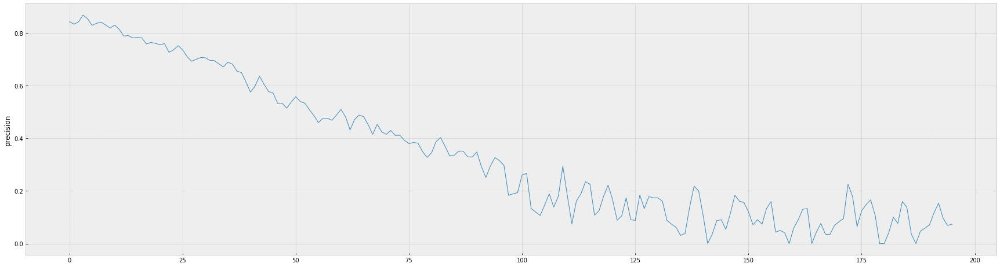

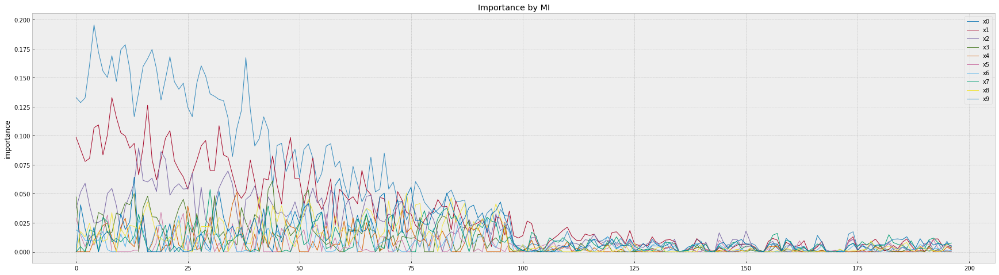

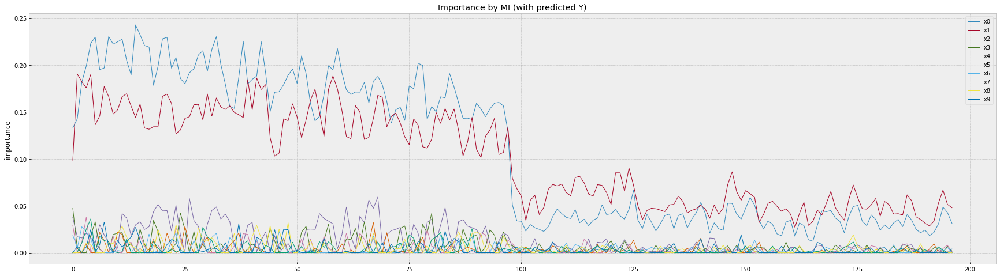

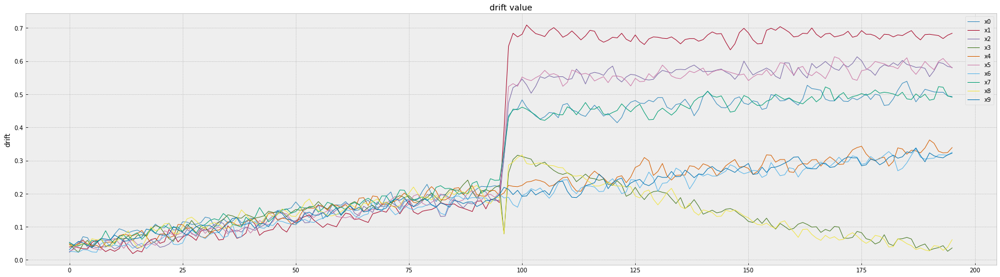

In [150]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


### 결론

importance의 점진적 변화는 감지 되지 않으나, <br>
급격한 Drift는 PMI에 반영되며<br>
이후importance의 변화도 PMI에 투영되는 듯 싶다 -> 확인 필요!!!

## concept drift의 case #9

Concept(Rule)의 변화 : X<br>
Importance의 변화 : X<br>
특정 feature만 Drift의 변화 : O<br>
성능 변화 : O <br>

In [105]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,1,1,1]
#wss2 =   [4,5,2,3,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,0,0,1,0,0,0,0,0,0]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            if drift_feature[f] == 1:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1,10)))
            
            ww = i/1000
            #weight[f'w{f}'].extend((wss1[f]*(1-ww) + wss2[f]*ww) + np.random.normal(0.0,0.01,10))
            weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

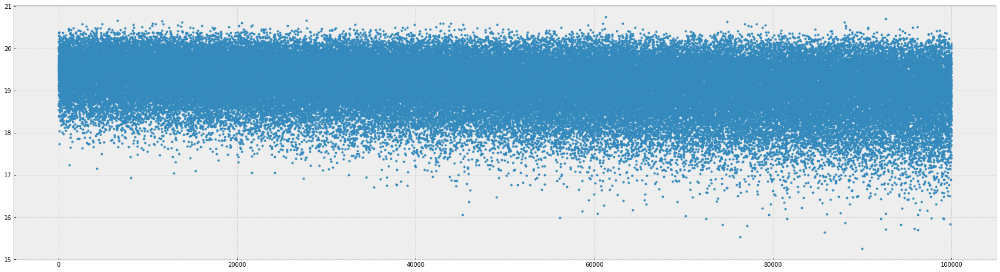

In [106]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [107]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

y mean: 19.411118477859056


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.662325,0.915368,0.853795,0.971030,0.946783,0.966766,0.860917,0.919929,0.832203,0.958331,0
99996,0.631323,0.942034,0.973519,0.811219,0.868095,0.770885,0.925595,0.917272,0.893178,0.938779,0
99997,0.757357,0.910226,0.979120,0.609015,0.882451,0.840965,0.918705,0.883398,0.780469,0.825663,0
99998,0.776306,0.950244,0.943173,0.899569,0.982444,0.922953,0.973099,0.980597,0.983211,0.970961,0


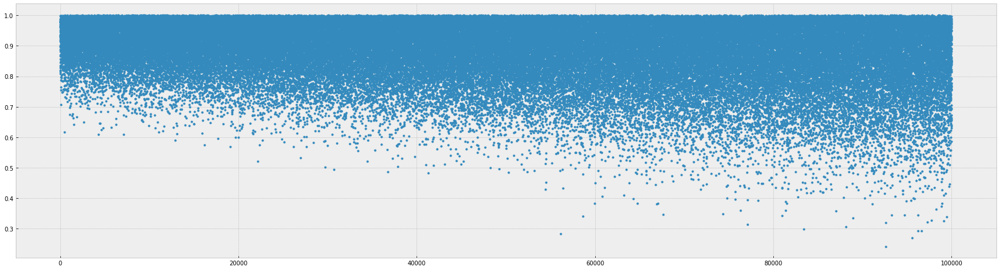

In [122]:
plt.figure(figsize=(30,8))
plt.plot(dataset['x0'],'.')

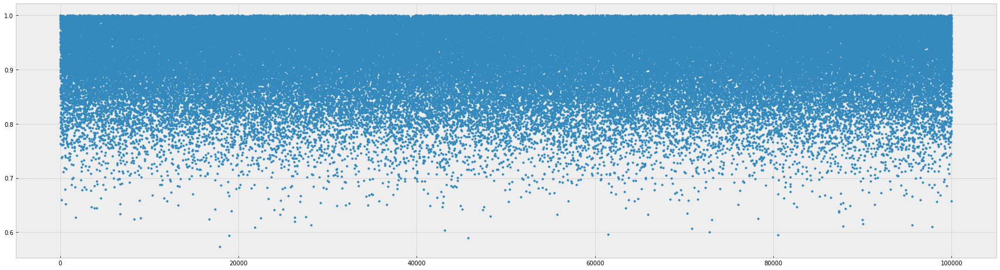

In [123]:
plt.figure(figsize=(30,8))
plt.plot(dataset['x1'],'.')

default performance: (0.8980582524271845, 0.9438775510204082, 0.9203980099502488, None)


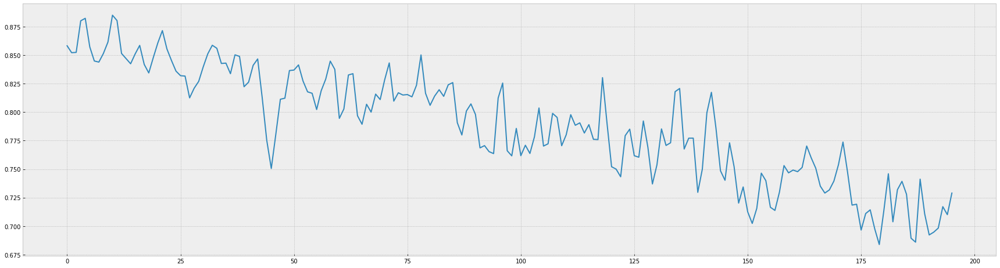

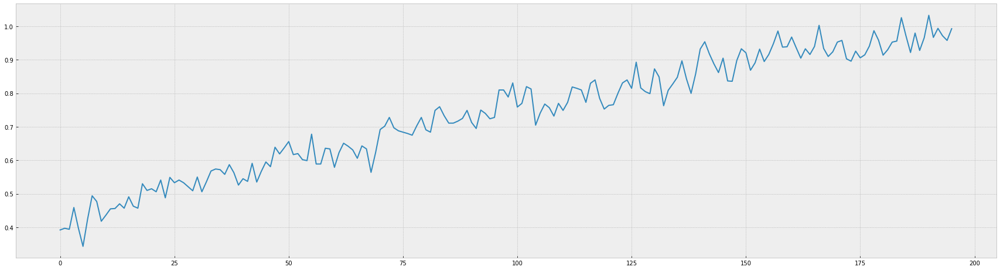

In [108]:

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [109]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

        x0        x1        x2        x3   x4        x5        x6   x7  \
0  0.13275  0.110939  0.033432  0.043636  0.0  0.026247  0.029931  0.0   

         x8   x9  
0  0.000892  0.0  
196/196 f1:0.7290

[]

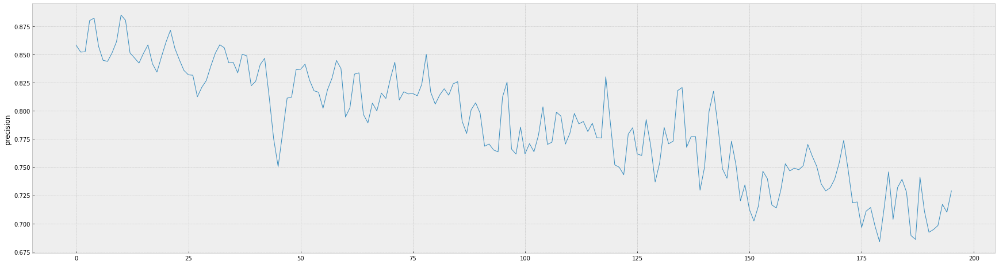

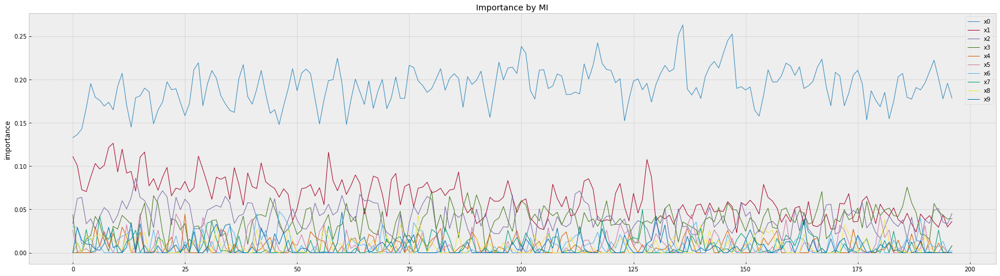

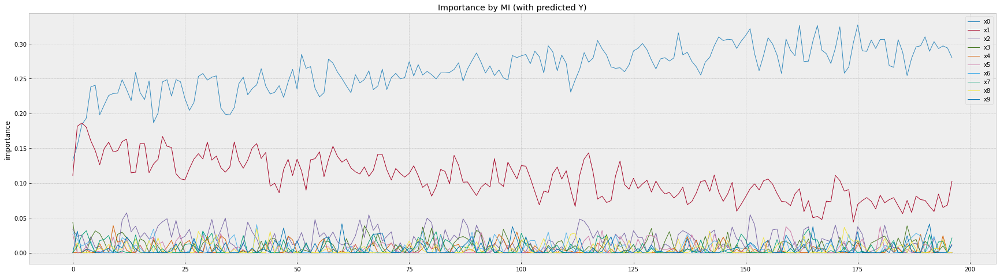

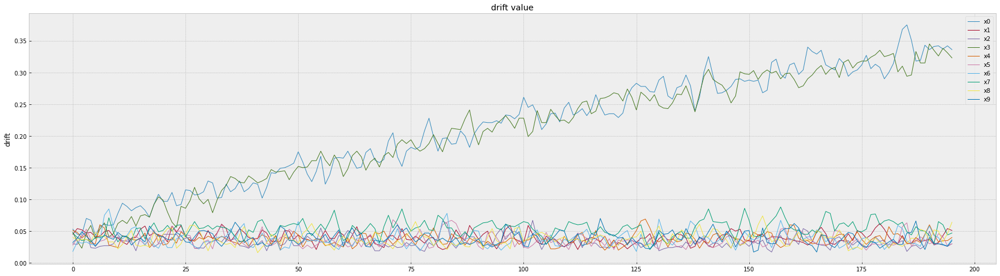

In [110]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


### 결론

feature의 상대적 importance에 따라, PMI가 상대적으로 각 feature별 증가, 감소가 일어남. <br>
해석 방법을 알아야 하는데...

## concept drift의 case #10

Concept(Rule)의 변화 : X<br>
Importance의 변화 + 점진: O<br>
Drift의 변화 + 단계적 : O<br>
성능 변화 : O <br>

In [188]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,0,0,0]
wss2 =   [0,0,0,1,1,1,2,3,4,5]
# drift가 발생하는 feature
drift_feature = [1,0,0,1,0,0,0,0,0,0]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (int(i%100)*0.0001) + (i*0.0001),10)))
            #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1,10)))
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1,10)))         
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.15,10)))

            ww = i/1000
            weight[f'w{f}'].extend((wss1[f]*(1-ww) + wss2[f]*ww) + np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

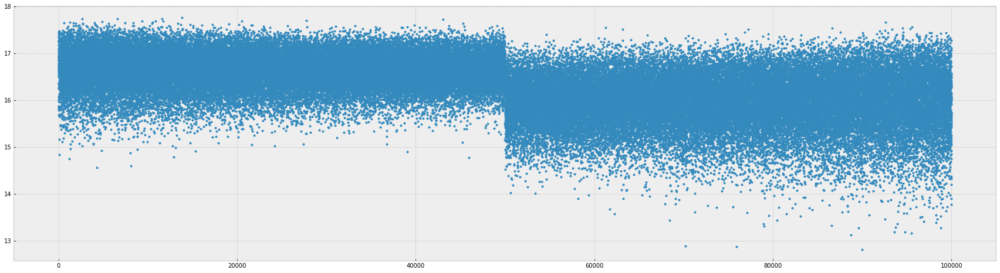

In [189]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [190]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]
dataset

y mean: 16.647573156277964


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.895684,0.792031,0.940057,0.812780,0.959240,0.746932,0.949380,0.978290,0.972478,0.929717,0
1,0.917914,0.858407,0.996082,0.952297,0.941283,0.945107,0.921507,0.833492,0.975585,0.956110,1
2,0.933485,0.998429,0.970274,0.958623,0.912402,0.915149,0.894663,0.982727,0.959104,0.828651,1
3,0.817737,0.884680,0.950692,0.893894,0.991393,0.901659,0.889030,0.997981,0.860043,0.975888,0
4,0.855842,0.811231,0.994532,0.880043,0.961054,0.867799,0.791962,0.943408,0.943762,0.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,0.746617,0.873052,0.780693,0.978262,0.920175,0.950149,0.791376,0.879893,0.748304,0.937496,0
99996,0.723354,0.913051,0.960278,0.858343,0.802143,0.656327,0.888392,0.875908,0.839767,0.908168,0
99997,0.817927,0.865339,0.968680,0.706615,0.823676,0.761448,0.878058,0.825098,0.670703,0.738495,0
99998,0.832146,0.925367,0.914760,0.924639,0.973667,0.884430,0.959648,0.970895,0.974817,0.956442,1


default performance: (0.8853211009174312, 0.9234449760765551, 0.9039812646370023, None)


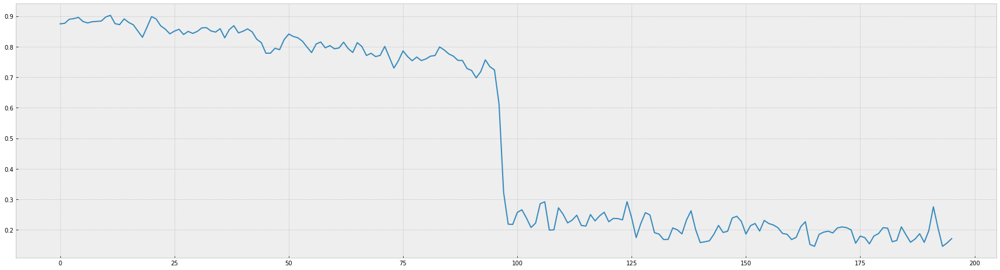

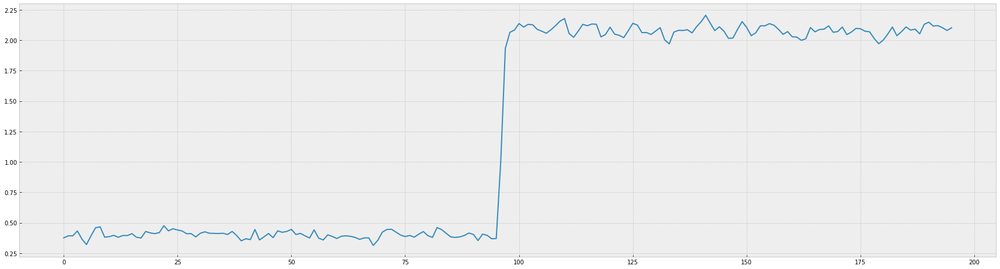

In [191]:

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [192]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

        x0        x1        x2        x3        x4       x5        x6   x7  \
0  0.13514  0.125914  0.040756  0.027943  0.012466  0.00982  0.014886  0.0   

         x8   x9  
0  0.008431  0.0  
196/196 f1:0.1713

[]

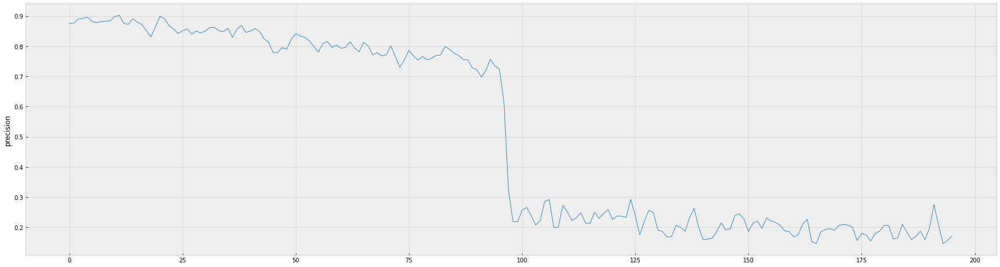

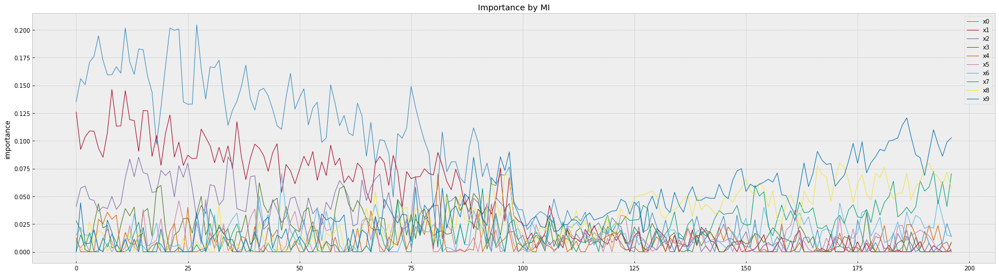

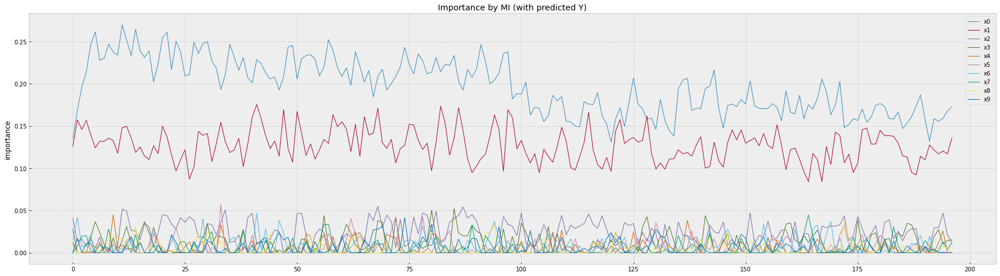

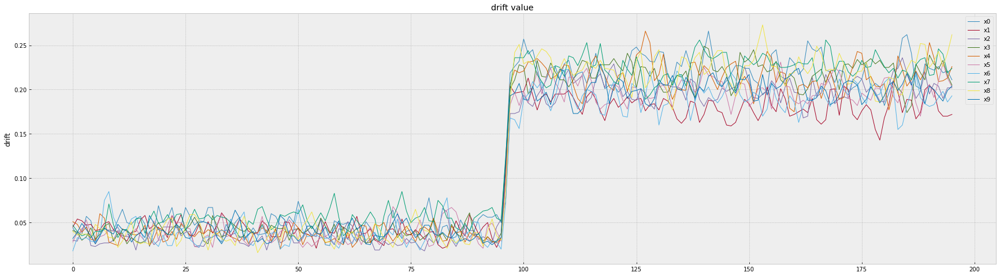

In [193]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


### 결론

역시, PMI에는 importance의 변화가 감지되지 않는다.